# Get the bounding box of the human body（*code task 3*）

参考了[lxiao428](https://blog.csdn.net/lxiao428/article/details/86500035)的博客和[opencv二值化教程](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_thresholding/py_thresholding.html)

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import os
import cv2
from matplotlib import pyplot as plt

In [3]:
def get_body(img_dir):
    '''
    give the bboxes of the human of the given images
    Args:
        img_dir(string): the directory of the images
    Return:
        bboxes(list of dictionary[{}])：the dictionary includes 2 items: "bbox(list)[xmin, ymin, xmax, ymax]" and "filename(string)"
    '''
    files = os.listdir(img_dir)
    bboxes = []
    imgs = []
    for file in files:
        if not file[-3:] == 'jpg':
            continue
        record = {}
        bbox = []
        filename = os.path.join(img_dir, file)
        record['filename'] = filename
        simg = cv2.imread(filename)
#         downsampling
        img = cv2.pyrDown(simg, cv2.IMREAD_UNCHANGED)
#         get binary image using otsu, blur to get a better result 
        blur = cv2.GaussianBlur(img[:,:,0],(9,9),0)
        ret3,thresh  = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        image, contours, hier = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        xmin = []
        ymin = []
        xmax = []
        ymax = []
#        get bounding boxes
        for c in contours:
            x, y, w, h = cv2.boundingRect(c)
            if w*h<40 or y<25:
                continue
            xmin.append(x)
            ymin.append(y)
            xmax.append(x+w)
            ymax.append(y+h)
            cv2.rectangle(img, (x,y),(x+w,y+h), (0, 255, 0), 2)
#        merge the bounding boxes
        bbox.append(2*min(xmin))
        bbox.append(2*min(ymin))
        bbox.append(2*max(xmax))
        bbox.append(2*max(ymax))
#         map to the source image
        cv2.rectangle(simg, (2*min(xmin), 2*min(ymin)), (2*max(xmax), 2*max(ymax)), (0, 255, 0), 2)
        imgs.append(simg)
        record['bbox'] = bbox
        bboxes.append(record)
    plt.figure(figsize=(20,2*len(imgs)))
    for i in range(1,len(imgs)):
        plt.subplot(len(imgs)/4+1,4,i)
        plt.imshow(imgs[i])
    return bboxes

[{'filename': 'tiny_simdata/train/017_lighter_20190925154713645_19001.jpg',
  'bbox': [16, 86, 170, 360]},
 {'filename': 'tiny_simdata/train/002_gun_20191115152554877_19002-1.jpg',
  'bbox': [36, 58, 170, 362]},
 {'filename': 'tiny_simdata/train/017_lighter_20190925154440521_19001.jpg',
  'bbox': [30, 86, 172, 360]},
 {'filename': 'tiny_simdata/train/002_gun_20191115152642104_19002-1.jpg',
  'bbox': [42, 58, 170, 362]},
 {'filename': 'tiny_simdata/train/002_gun_20191115152305778_19002.jpg',
  'bbox': [8, 56, 190, 360]},
 {'filename': 'tiny_simdata/train/002_gun_20191115152458168_19002.jpg',
  'bbox': [0, 58, 190, 360]},
 {'filename': 'tiny_simdata/train/002_gun_20191115152516044_19002-1.jpg',
  'bbox': [18, 60, 170, 364]},
 {'filename': 'tiny_simdata/train/002_gun_20191115152630728_19002.jpg',
  'bbox': [0, 58, 190, 360]},
 {'filename': 'tiny_simdata/train/002_gun_20191115152743343_19002-1.jpg',
  'bbox': [32, 60, 166, 358]},
 {'filename': 'tiny_simdata/train/002_gun_20191115152347521_

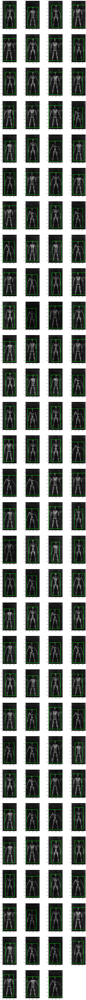

In [4]:
get_human('tiny_simdata/train')

In [5]:
%%writefile ./codes/get_body.py
import os
import cv2

def get_body(img_dir):
    '''
    give the bboxes of the human of the given images
    Args:
        img_dir(string): the directory of the images
    Return:
        bboxes(list of dictionary[{}])：the dictionary includes 2 items:
             bbox(list): [xmin, ymin, xmax, ymax]
             filename(string): the path of the image
    '''
    files = os.listdir(img_dir)
    bboxes = []
    for file in files:
        if not file[-3:] == 'jpg':
            continue
        record = {}
        bbox = []
        filename = os.path.join(img_dir, file)
        record['filename'] = filename
        source_img = cv2.imread(filename)
        down_img = cv2.pyrDown(source_img, cv2.IMREAD_UNCHANGED)
        blur = cv2.GaussianBlur(down_img[:,:,0],(9,9),0)
        ret,thresh  = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        image, contours, hier = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        xmin = []
        ymin = []
        xmax = []
        ymax = []
        for c in contours:
            x, y, w, h = cv2.boundingRect(c)
            if w*h<40 or y<25:
                continue
            xmin.append(x)
            ymin.append(y)
            xmax.append(x+w)
            ymax.append(y+h)
        bbox.append(2*min(xmin))
        bbox.append(2*min(ymin))
        bbox.append(2*max(xmax))
        bbox.append(2*max(ymax))
        record['bbox'] = bbox
        bboxes.append(record)
    return bboxes

Overwriting ./codes/get_body.py


In [6]:
from codes.get_body import get_body
get_body('tiny_simdata/val')

[{'filename': 'tiny_simdata/val/017_lighter_20190925155116990_19001.jpg',
  'bbox': [48, 88, 160, 360]},
 {'filename': 'tiny_simdata/val/002_gun_20191115153207028_19002.jpg',
  'bbox': [4, 54, 190, 362]},
 {'filename': 'tiny_simdata/val/017_lighter_20190925155016234_19001-1.jpg',
  'bbox': [4, 86, 164, 362]},
 {'filename': 'tiny_simdata/val/017_lighter_20190925160735174_19001-1.jpg',
  'bbox': [26, 90, 154, 362]},
 {'filename': 'tiny_simdata/val/002_gun_20191115153254440_19002-1.jpg',
  'bbox': [0, 56, 168, 362]},
 {'filename': 'tiny_simdata/val/002_gun_20191115153223718_19002.jpg',
  'bbox': [0, 58, 164, 362]},
 {'filename': 'tiny_simdata/val/017_lighter_20190925155016234_19001.jpg',
  'bbox': [36, 86, 170, 358]},
 {'filename': 'tiny_simdata/val/017_lighter_20190925155054925_19001.jpg',
  'bbox': [28, 88, 158, 360]},
 {'filename': 'tiny_simdata/val/002_gun_20191115153038771_19002.jpg',
  'bbox': [0, 56, 146, 360]},
 {'filename': 'tiny_simdata/val/002_gun_20191115153135369_19002-1.jpg'